In [ ]:
import pandas as pd
import numpy as np
from wordcloud import WordCloud, STOPWORDS
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
df = pd.read_csv('IMDB Dataset.csv')

df.head(10)

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
5,"Probably my all-time favorite movie, a story o...",positive
6,I sure would like to see a resurrection of a u...,positive
7,"This show was an amazing, fresh & innovative i...",negative
8,Encouraged by the positive comments about this...,negative
9,If you like original gut wrenching laughter yo...,positive


In [ ]:
df['sentiment'] = df['sentiment'].apply(lambda x : 1 if x == 'positive' else 0)

df.head(10)

,review,sentiment
0,One of the other reviewers has mentioned that ...,1
1,A wonderful little production. <br /><br />The...,1
2,I thought this was a wonderful way to spend ti...,1
3,Basically there's a family where a little boy ...,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",1
5,"Probably my all-time favorite movie, a story o...",1
6,I sure would like to see a resurrection of a u...,1
7,"This show was an amazing, fresh & innovative i...",0
8,Encouraged by the positive comments about this...,0
9,If you like original gut wrenching laughter yo...,1


In [ ]:
df['review'][0]
#1 grams with TF-IDF 
#features = bag of 1-grams with sparse matrix of tf-idf value
#will find the weight of each feature, using bag of words representation and
#multiply each one of the tf-idf values by that weight
#sum all that, pass it thru sigmoid = logistic reg model
#linear classification

"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to the fa

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
count = CountVectorizer()

docs = np.array(['The sun is shining','The weather is sweet',
        'The sun is shining, the weather is sweet, and one is two'])

In [ ]:
bag = count.fit_transform(docs)

In [ ]:
print(count.vocabulary_)

{'the': 6, 'sun': 4, 'is': 1, 'shining': 3, 'weather': 8, 'sweet': 5, 'and': 0, 'one': 2, 'two': 7}


In [ ]:
print(bag.toarray())

[[0 1 0 1 1 0 1 0 0]
 [0 1 0 0 0 1 1 0 1]
 [1 3 1 1 1 1 2 1 1]]


In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer

In [ ]:
tfidf = TfidfTransformer(use_idf=True, norm='l2',smooth_idf=True )

In [ ]:
np.set_printoptions(precision = 2)
print(tfidf.fit_transform(count.fit_transform(docs)).toarray())

[[0.   0.43 0.   0.56 0.56 0.   0.43 0.   0.  ]
 [0.   0.43 0.   0.   0.   0.56 0.43 0.   0.56]
 [0.32 0.56 0.32 0.24 0.24 0.24 0.38 0.32 0.24]]


In [ ]:
#Data Preparation
#cleaning tags
df.loc[0, 'review'][150:200]

' me.<br /><br />The first thing that struck me abo'

In [ ]:
import re

def preprocessor(text):
    text = re.sub('<[^>]*>','', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text)
    text = re.sub('[\W]+', ' ', text.lower()) + \
        ' '.join(emoticons).replace('-', '')
    return text

In [ ]:
preprocessor(df.loc[0, 'review'][150:200])

' me the first thing that struck me abo'

In [ ]:
df['review']= df['review'].apply(preprocessor)

In [ ]:
#Tokenization of Documents
from nltk.stem.porter import PorterStemmer

porter = PorterStemmer()

In [ ]:
def tokenizer(text):
    return text.split()

def tokenizer_porter(text):
    return [porter.stem(word) for word in text.split()]

In [ ]:
tokenizer_porter('my favorite sport is running')

['my', 'favorit', 'sport', 'is', 'run']

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Murtaza
[nltk_data]     Kazmi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords

stop = stopwords.words('english')
[w for w in tokenizer_porter('a sprinter likes sprinting and sprints every day'
                            ) if w not in stop]
print(stop)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
#Transforming text data into tf-idf vectors
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(strip_accents = None,lowercase=False,
                       preprocessor = None,
                       tokenizer= tokenizer_porter,
                       use_idf=True,
                       norm ='l2',
                       smooth_idf = True)
y = df.sentiment.values
X = tfidf.fit_transform(df.review)

In [ ]:
#Document Classification - Logistic Regression

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 1, test_size = 0.5,
                 shuffle=False)

In [ ]:
import pickle
from sklearn.linear_model import LogisticRegressionCV

clf = LogisticRegressionCV(cv = 5,
                          scoring = 'accuracy',
                          random_state = 0,
                          n_jobs = -1,
                          verbose = 3,
                          max_iter=300).fit(X_train, y_train)
saved_model = open('saved_model.sav', 'wb')
pickle.dump(clf, saved_model)
saved_model.close()

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  2.3min remaining:  3.4min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.4min finished


In [ ]:
#MODEL EVALUATION
filename = 'saved_model.sav'
saved_clf = pickle.load(open(filename, 'rb'))


In [ ]:
accuracy_logistic = saved_clf.score(X_test, y_test)
print(accuracy_logistic)

0.89472


In [ ]:
y_pred = saved_clf.predict(X_test)

In [ ]:
print("Classification Report:")
logistic_class_report = classification_report(y_test, y_pred)
print(logistic_class_report)

logistic_confusion_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(logistic_confusion_matrix)

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.89      0.89     12474
           1       0.89      0.90      0.90     12526

    accuracy                           0.89     25000
   macro avg       0.89      0.89      0.89     25000
weighted avg       0.89      0.89      0.89     25000

Confusion Matrix:
[[11045  1429]
 [ 1203 11323]]


In [ ]:
#do from:
#Naive bayes
#Neural nets
#word cloud = only visualization
#compare models
#f measure, confusion matrix

In [ ]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Embedding, Conv1D, GlobalMaxPooling1D
from keras.datasets import imdb

max_features = 5000
maxlen = 200
batch_size = 64
embedding_dims = 16
filters = 128
kernel_size = 3
hidden_size = 128
epochs = 3



25000


In [ ]:
(x_train, y_train), (x_test, y_test)= imdb.load_data(num_words = max_features)

print(len(x_train))

In [ ]:
#normalizing p seq
x_train = sequence.pad_sequences(x_train, maxlen = maxlen)

In [ ]:
model = Sequential()
model.add(Embedding(max_features, embedding_dims, input_length = maxlen))
model.add(Conv1D(filters, kernel_size, padding= 'valid', activation = 'relu', strides = 1))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))

model.compile(optimizer='adam', loss = 'binary_crossentropy', metrics = ['acc'])

model.fit(x_train, y_train, batch_size = batch_size, epochs = epochs)

C:\Users\Murtaza Kazmi\Anaconda3\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/3
25000/25000 [==============================] - 18s 726us/step - loss: 0.4690 - acc: 0.75335s - lo - ETA: - ETA: 0s - loss: 0.4714 - acc: 0.
Epoch 2/3
25000/25000 [==============================] - 17s 684us/step - loss: 0.2625 - acc: 0.89170s - loss: 0.2630 - acc
Epoch 3/3
25000/25000 [==============================] - 17s 676us/step - loss: 0.1896 - acc: 0.92622s - los - ETA: 0s - loss: 0.1901 - ac


In [ ]:
x_test = sequence.pad_sequences(x_test, maxlen = maxlen)
y_pred_ = model.predict_classes(x_test)

In [ ]:
y_pred_

array([[0],
       [1],
       [1],
       ...,
       [0],
       [0],
       [0]])

In [ ]:
print("Classification Report:")
keras_class_report = classification_report(y_test,y_pred_)
print(keras_class_report)

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.94      0.88     12500
           1       0.93      0.79      0.86     12500

    accuracy                           0.87     25000
   macro avg       0.87      0.87      0.87     25000
weighted avg       0.87      0.87      0.87     25000



In [ ]:
print("Confusion Matrix:")
keras_conf_matrix = confusion_matrix(y_test, y_pred_)
print(keras_conf_matrix)

Confusion Matrix:
[[11724   776]
 [ 2568  9932]]


In [ ]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 1, test_size = 0.1,
                 shuffle=False)

In [ ]:
BernNB = BernoulliNB()
BernNB.fit(X_train, y_train)
print(BernNB)

y_expect = y_test
y_pred = BernNB.predict(X_test)
print(accuracy_score(y_expect, y_pred))

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)
0.8568


In [ ]:
naive_bayes_class_report = classification_report(y_test, y_pred)
print(naive_bayes_class_report)

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      2530
           1       0.87      0.84      0.85      2470

    accuracy                           0.86      5000
   macro avg       0.86      0.86      0.86      5000
weighted avg       0.86      0.86      0.86      5000



In [ ]:
naive_bayes_confusion_matrix = confusion_matrix(y_test, y_pred)
print(naive_bayes_confusion_matrix)

[[2219  311]
 [ 405 2065]]


In [ ]:
'''True positive = 10793
TN = 10424
FP = 1681
FN = 2102
'''

'True positive = 10793\nTN = 10424\nFP = 1681\nFN = 2102\n'

In [ ]:
data_for_wordcloud = ""
for i in df.review:
    data_for_wordcloud += i
print(data_for_wordcloud[:100])

one of the other reviewers has mentioned that after watching just 1 oz episode you ll be hooked they


In [ ]:
for i in set(STOPWORDS):
    data_for_wordcloud = data_for_wordcloud.replace(" "+i+" "," ")

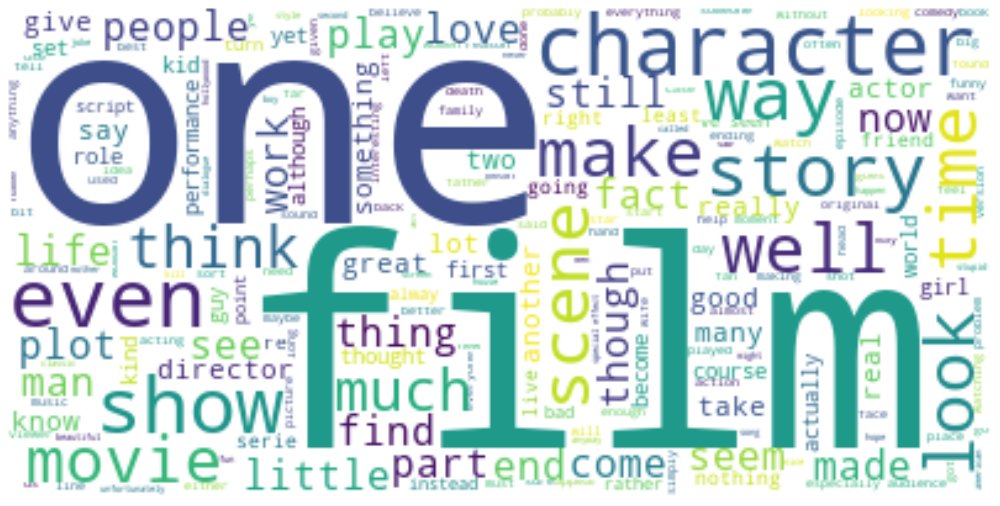

In [ ]:
wordcloud_spam = WordCloud(background_color="white").generate(data_for_wordcloud)

plt.figure(figsize = (20,20), dpi=550)
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
#Compare models based on reports and accuracy

In [ ]:
positive_data_for_wordcloud = ""
positive_df = df[df['sentiment'] == 1]

In [ ]:
for i in positive_df.review:
    positive_data_for_wordcloud += i
print(positive_data_for_wordcloud[:100])

one of the other reviewers has mentioned that after watching just 1 oz episode you ll be hooked they


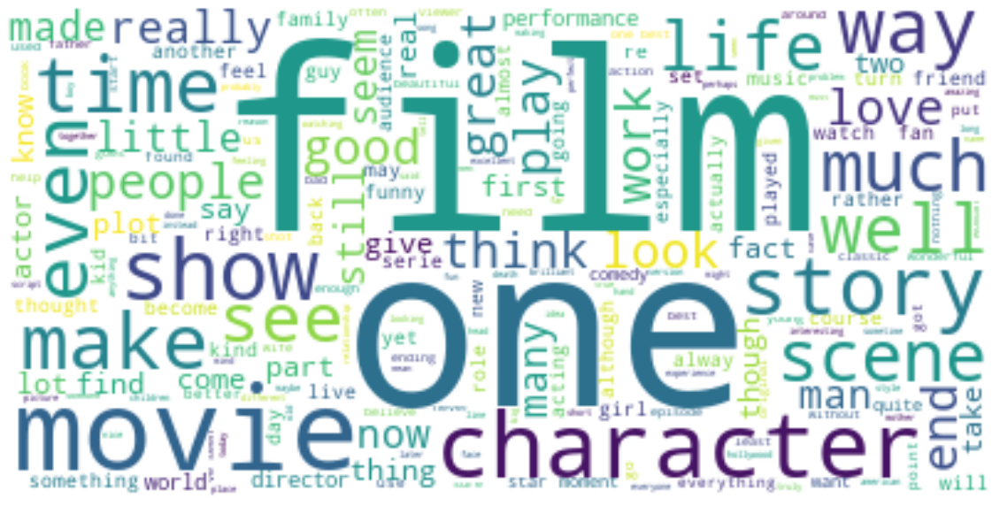

In [ ]:
wordcloud_spam = WordCloud(background_color="white").generate(positive_data_for_wordcloud)

plt.figure(figsize = (20,20))
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
negative_data_for_wordcloud = ""
negative_df = df[df['sentiment'] == 0]

In [ ]:
for i in negative_df.review:
    negative_data_for_wordcloud += i
print(negative_data_for_wordcloud[:100])

one of the other reviewers has mentioned that after watching just 1 oz episode you ll be hooked they


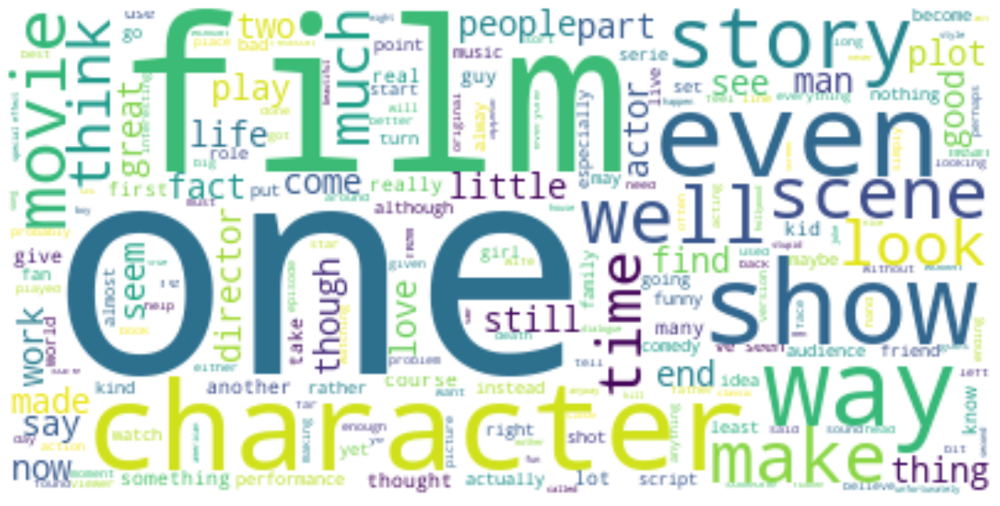

In [ ]:
wordcloud_spam = WordCloud(background_color="white").generate(negative_data_for_wordcloud)

plt.figure(figsize = (20,20))
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

C:\Users\Murtaza Kazmi\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:2260: ChangedBehaviorWarning: The long-standing behavior to use the accuracy score has changed. The scoring parameter is now used. This warning will disappear in version 0.22.
  ChangedBehaviorWarning)


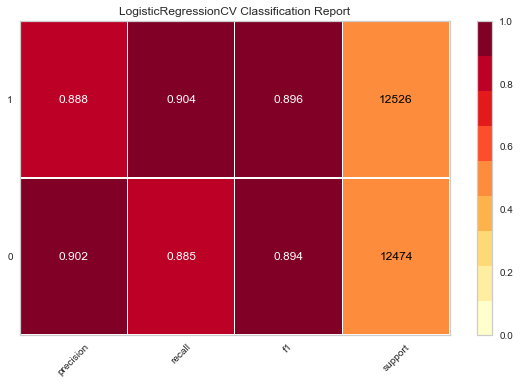

In [ ]:
from yellowbrick.classifier import ClassificationReport

saved_model = open('saved_model.sav', 'wb')
pickle.dump(clf, saved_model)
visualizer = ClassificationReport(clf, support=True, force_model = True)
saved_model.close()

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test) 
visualizer.show()


C:\Users\Murtaza Kazmi\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:2260: ChangedBehaviorWarning: The long-standing behavior to use the accuracy score has changed. The scoring parameter is now used. This warning will disappear in version 0.22.
  ChangedBehaviorWarning)


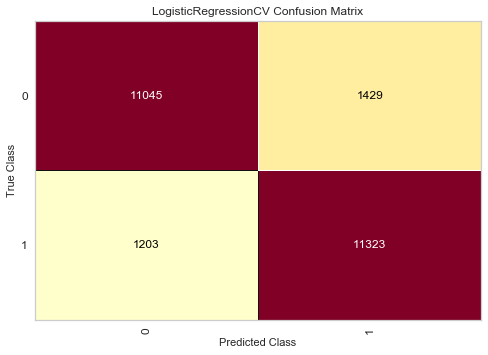

In [ ]:
from yellowbrick.classifier import ConfusionMatrix
saved_model = open('saved_model.sav', 'wb')
pickle.dump(clf, saved_model)
visualizer = ConfusionMatrix(clf, support=True, force_model = True)
saved_model.close()

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test) 
visualizer.show()

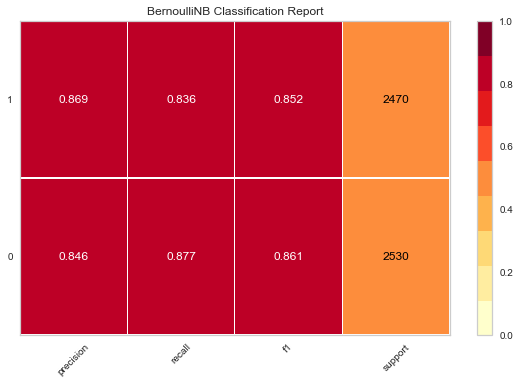

In [ ]:
visualizer = ClassificationReport(BernNB, support=True, force_model = True)

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test) 
visualizer.show()

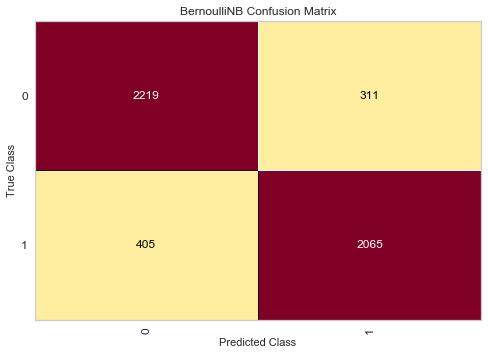

In [ ]:
visualizer = ConfusionMatrix(BernNB, support=True, force_model = True)
#print("Neural-Network Classification Report:")
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test) 
visualizer.show()

In [ ]:
print("Neural-Network Classification Report:")
print(keras_class_report)

Neural-Network Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.94      0.88     12500
           1       0.93      0.79      0.86     12500

    accuracy                           0.87     25000
   macro avg       0.87      0.87      0.87     25000
weighted avg       0.87      0.87      0.87     25000



Neural-Network Confusion Matrix:


[Text(52.0, 0.5, 'True Class'), Text(0.5, 29.5, 'Predicted Class')]

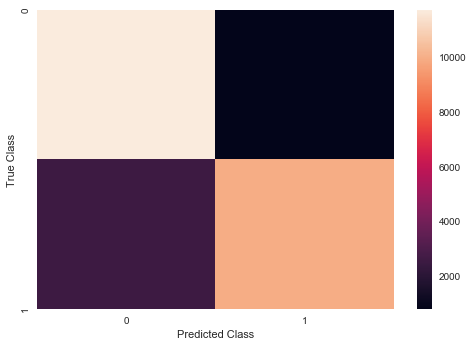

In [ ]:
import seaborn as sns
print("Neural-Network Confusion Matrix:")
z = sns.heatmap(keras_conf_matrix)
z.set(xlabel = 'Predicted Class', ylabel = 'True Class')

In [ ]:
x = ["Logistic Regression","Neural Network","Naive-Bayes"]
y = [0.89472,0.92622,0.8568]

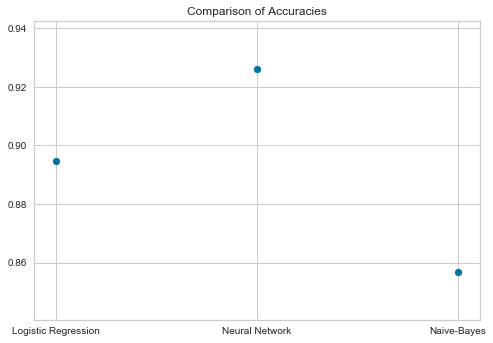

In [ ]:
plt.scatter(x, y = [0.89472,0.92622,0.8568])
plt.title('Comparison of Accuracies')
plt.show()

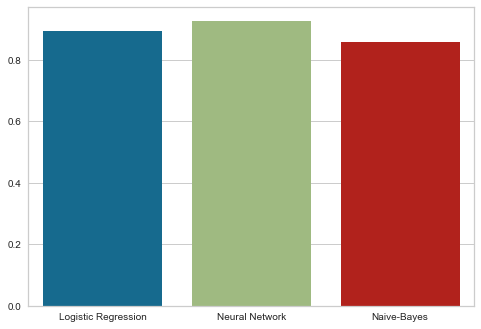

In [ ]:
sns.barplot(x,y)